[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/ee-ortiz/ISIS-4825_202510_IMAGENES_Y_VISION/blob/main/Laboratorio_09/MISIS4825_Laboratorio09_Taller.ipynb)

![image](https://drive.google.com/u/0/uc?id=15DUc09hFGqR8qcpYiN1OajRNaASmiL6d&export=download)

# Laboratorio 09 – Taller: Detección de Objetos con YOLO

## Introducción

En este taller trabajaremos con el tema de la **detección de objetos**, que consiste en localizar y clasificar múltiples objetos dentro de una imagen. Esta técnica tiene aplicaciones en diversos campos, como:

- **Seguridad**: detección de personas, rostros o vehículos en sistemas de videovigilancia.  
- **Automoción**: identificación de peatones y señales de tránsito en vehículos autónomos.  
- **Agricultura**: conteo de plantas o frutos en imágenes aéreas.  
- **Medicina**: localización de anomalías en imágenes médicas como radiografías o resonancias magnéticas.  

El algoritmo **YOLO** (*You Only Look Once*) es conocido por realizar detecciones en tiempo real mediante una sola pasada de la imagen. Desde su primera versión en 2016, ha evolucionado hasta **YOLOv11**, que introduce mejoras en la arquitectura y en la velocidad de entrenamiento.

## Objetivos

1. **Entender la arquitectura de YOLO** y sus componentes principales (*Backbone*, *Neck* y *Head*).  
2. **Preparar un conjunto de datos** en formato YOLO para entrenamiento.  
3. **Entrenar un modelo YOLOv11** utilizando un dataset de detección de animales.  
4. **Evaluar el rendimiento del modelo** mediante métricas como mAP50 y mAP50–95.  
5. **Explorar configuraciones avanzadas** como variantes del modelo (*nano*, *small*, *medium*) y ajustes de hiperparámetros.  


**Datos:** [multiclass-animal-detection](https://www.kaggle.com/datasets/notaashman/multiclass-animal-detection)

## 1. Descarga y Preparación del Dataset

In [17]:
import os
import json

In [18]:
# Instalación de Kaggle
!pip install kaggle --quiet

In [19]:
# Cargar credenciales desde kaggle.json
with open('kaggle.json', 'r') as f:
    kaggle_creds = json.load(f)
os.environ['KAGGLE_USERNAME'] = kaggle_creds['username']
os.environ['KAGGLE_KEY'] = kaggle_creds['key']

# Descargar y descomprimir
from kaggle.api.kaggle_api_extended import KaggleApi
api = KaggleApi()
api.authenticate()
api.dataset_download_files(
    'notaashman/multiclass-animal-detection',
    path='data',
    unzip=True
)

Dataset URL: https://www.kaggle.com/datasets/notaashman/multiclass-animal-detection


## 2. Exploración de Datos

El conjunto de datos está organizado en tres particiones principales: `train`, `valid` y `test`. Cada partición contiene dos subcarpetas:

- `images/`: Contiene las imágenes en formato `.jpg` o `.png`.  
- `labels/`: Contiene las etiquetas en formato `.txt`, donde cada archivo describe las clases y las coordenadas de las cajas delimitadoras (*bounding boxes*).  

       count
train   1400
valid    300
test     300


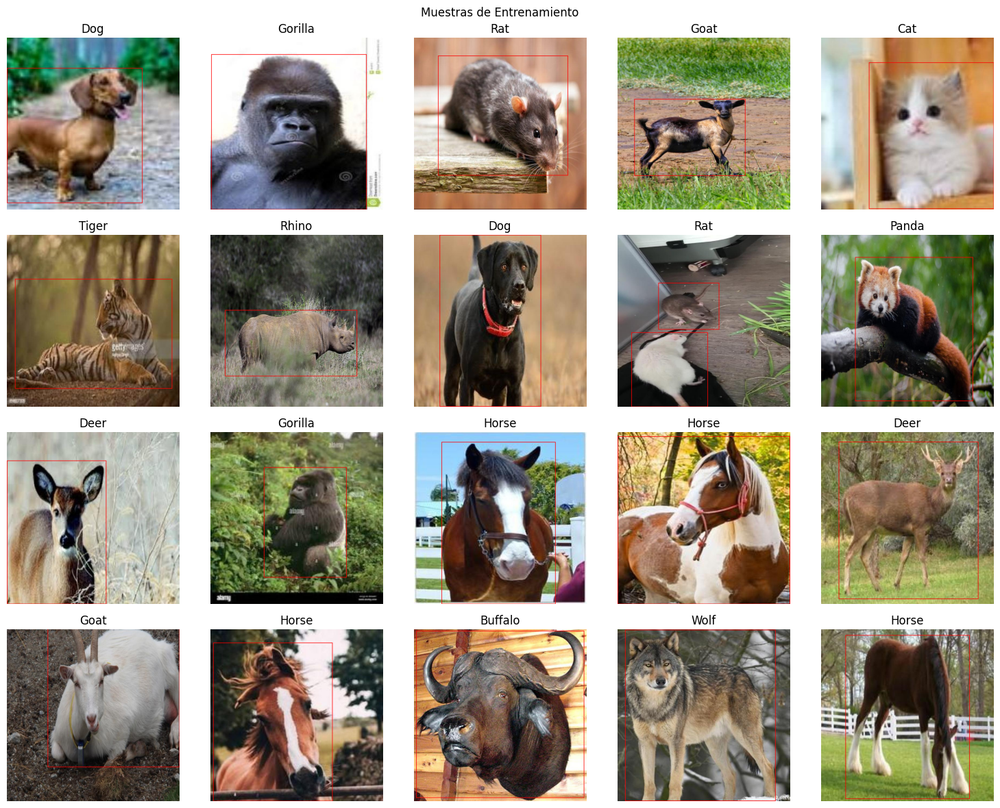

In [20]:
from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw
import random

DATA_ROOT = Path('data') / 'Multi-Class Animal Detection.v1-yolov8'
if not DATA_ROOT.exists():
    raise FileNotFoundError(f"Ruta de datos no encontrada: {DATA_ROOT}")

root = DATA_ROOT
train_img = root / 'train' / 'images'
train_lbl = root / 'train' / 'labels'

# Definir clases
class_names = [
    "Buffalo", "Camel", "Cat", "Cheetah", "Cow", "Deer", "Dog", "Elephant",
    "Goat", "Gorilla", "Hippo", "Horse", "Lion", "Monkey", "Panda", "Rat",
    "Rhino", "Tiger", "Wolf", "Zebra"
]

# 1. Conteo de imágenes y distribución numérica
counts = {}
for split in ['train', 'valid', 'test']:
    path = root / split / 'images'
    counts[split] = len(list(path.glob('*.*'))) if path.exists() else 0

# Mostrar tabla de distribución
dist = pd.Series(counts, name='count')
print(dist.to_frame())

# 2. Visualizar muestras con bounding boxes y título de clase
population = list(train_img.glob('*.*'))
if not population:
    raise FileNotFoundError(f"No se encontraron imágenes en {train_img}")

# Tomar hasta 20 muestras
k = min(20, len(population))
sample_images = random.sample(population, k)

n_cols = 5
n_rows = (k + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 3 * n_rows))

for ax, img_path in zip(axes.flatten(), sample_images):
    img = Image.open(img_path).convert("RGB")
    draw = ImageDraw.Draw(img)
    w, h = img.size

    lbl_path = train_lbl / f"{img_path.stem}.txt"
    title_labels = set()
    if lbl_path.exists():
        for line in lbl_path.read_text().splitlines():
            cls, x_c, y_c, bw, bh = map(float, line.split())
            # Convertir a coordenadas de pixeles
            cx, cy = x_c * w, y_c * h
            bw_pix, bh_pix = bw * w, bh * h
            x1, y1 = cx - bw_pix/2, cy - bh_pix/2
            x2, y2 = cx + bw_pix/2, cy + bh_pix/2
            draw.rectangle([x1, y1, x2, y2], outline='red', width=2)
            title_labels.add(class_names[int(cls)])

    ax.imshow(img)
    ax.set_title(", ".join(sorted(title_labels)) or "Sin etiqueta")
    ax.axis('off')

# Ocultar ejes sobrantes
for ax in axes.flatten()[k:]:
    ax.axis('off')

plt.suptitle('Muestras de Entrenamiento')
plt.tight_layout()
plt.show()

## 3. Preprocesamiento y YAML

En esta sección, se realiza la configuración necesaria para que el modelo YOLO pueda utilizar el conjunto de datos. Esto incluye:

1. **Definición de las clases**: Se especifican las categorías de objetos que el modelo debe detectar. En este caso, las clases corresponden a diferentes tipos de animales, como "Buffalo", "Camel", "Cat", entre otros.

2. **Creación del archivo YAML**: Este archivo es esencial para entrenar modelos YOLO, ya que define la estructura del conjunto de datos. Contiene información como:
   - La ruta base del conjunto de datos.
   - Las particiones de entrenamiento, validación y prueba.
   - El número total de clases (`nc`).
   - Los nombres de las clases (`names`).

El archivo YAML asegura que el modelo pueda interpretar correctamente las imágenes y etiquetas durante el entrenamiento y la evaluación.

In [21]:
# Crear animal-detection.yaml
yaml_content = f"""
path: {DATA_ROOT.absolute()}
train: train/images
val:   valid/images
test:  test/images

nc: {len(class_names)}
names: {class_names}
""".strip()
with open(DATA_ROOT / 'animal-detection.yaml', 'w') as f:
    f.write(yaml_content)

## 4 Arquitectura de YOLO

YOLO (“You Only Look Once”) cambió el paradigma de la detección de objetos al combinar en una sola red la localización y clasificación de instancias, evitando las etapas separadas de propuestas y refinamiento de métodos como R-CNN. Fue introducido por Redmon et al. en 2016 en *“You Only Look Once: Unified, Real-Time Object Detection”* ([ver paper](https://arxiv.org/abs/1506.02640)). Su flujo de datos se compone de:

1. **Backbone**  
   Una CNN profunda que extrae mapas de características a varios niveles de abstracción. En las familias modernas de YOLO suele emplearse CSPDarknet, que reduce la redundancia de gradiente y acelera el entrenamiento.

2. **Neck**  
   Una red de agregación multiescala (por ejemplo PANet o BiFPN) que fusiona los mapas del Backbone para capturar tanto objetos pequeños como grandes de forma eficiente.

3. **Head**  
   La capa final divide el mapa en una cuadrícula y, para cada celda, predice varias cajas delimitadoras, su confianza y la distribución de clases. Aplica Non-Max Suppression para filtrar solapamientos.

> A modo de ejemplo, la siguiente ilustración muestra el esquema general de YOLOv11, con sus tres bloques principales:
>  
> ![Arquitectura YOLOV11](https://miro.medium.com/v2/resize:fit:1100/format:webp/1*L8rMuwurmyBH1ixIqcrMSQ.png)  

### Variantes de YOLOv11

Para distintos balances de velocidad y precisión, YOLOv11 ofrece cinco tamaños preentrenados:

| Variante      | Parámetros aproximados | Uso recomendado                         |
|---------------|------------------------|-----------------------------------------|
| **v11n** (nano)   | ~2.6 M                   | Dispositivos edge, prototipado rápido    |
| **v11s** (small)  | ~9.4 M                   | Móviles, aplicaciones con recursos limitados |
| **v11m** (medium) | ~20.1 M                  | GPU de nivel medio, tareas generales     |
| **v11l** (large)  | ~25.3 M                  | Servidores potentes, máxima precisión     |
| **v11x** (XL)     | ~56.9 M                  | Investigación o despliegue en datacenter  |

En este laboratorio emplearemos **YOLOv11s**, que ofrece un buen compromiso entre velocidad de entrenamiento, latencia de inferencia y calidad de detección.


## 5. Entrenamiento del Modelo

Entrenaremos la variante **small** de YOLOv11 en el conjunto de datos de detección de animales.

Para obtener el modelo preentrenado de las diferentes variantes de YOLOv11, tenemos las siguientes opciones:

- `yolo11n.pt` — **nano**
- `yolo11s.pt` — **small**
- `yolo11m.pt` — **medium**
- `yolo11l.pt` — **large**
- `yolo11x.pt` — **extra large**

In [22]:
!pip install ultralytics --upgrade --quiet

In [23]:
from ultralytics import YOLO

# Cargar modelo base (small)
model = YOLO('yolo11s.pt')

# Entrenar
results = model.train(
    data=str(root / 'animal-detection.yaml'),
    epochs=20,
    imgsz=640,
    batch=16,
    patience=5,
    name='animal_yolov11s'
)

Ultralytics 8.3.129 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=data/Multi-Class Animal Detection.v1-yolov8/animal-detection.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=animal_yolov11s2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=5, pers

train: Scanning /content/data/Multi-Class Animal Detection.v1-yolov8/train/labels.cache... 1400 images, 1 backgrounds, 0 corrupt: 100%|██████████| 1400/1400 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 407.8±112.8 MB/s, size: 40.5 KB)


val: Scanning /content/data/Multi-Class Animal Detection.v1-yolov8/valid/labels.cache... 300 images, 1 backgrounds, 0 corrupt: 100%|██████████| 300/300 [00:00<?, ?it/s]


Plotting labels to runs/detect/animal_yolov11s2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000417, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/animal_yolov11s2
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      4.51G      1.035      3.799      1.511         34        640: 100%|██████████| 88/88 [00:38<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  3.08it/s]


                   all        300        412      0.339      0.444      0.373       0.26

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      5.27G      1.021      2.357       1.45         31        640: 100%|██████████| 88/88 [00:27<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.40it/s]


                   all        300        412      0.464      0.474      0.475      0.316

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      5.27G      1.038      2.076      1.479         25        640: 100%|██████████| 88/88 [00:29<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.46it/s]


                   all        300        412      0.449      0.462      0.461      0.266

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      5.27G      1.056      1.976      1.482         33        640: 100%|██████████| 88/88 [00:28<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.46it/s]

                   all        300        412      0.656      0.429      0.512      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      5.27G      1.061      1.802       1.47         18        640: 100%|██████████| 88/88 [00:28<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.50it/s]

                   all        300        412      0.525      0.521      0.522      0.348



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20      5.27G      1.016      1.678      1.455         28        640: 100%|██████████| 88/88 [00:27<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.45it/s]

                   all        300        412      0.567      0.608      0.636      0.406



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      5.27G      1.001      1.562      1.423         20        640: 100%|██████████| 88/88 [00:27<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.88it/s]

                   all        300        412      0.592      0.561      0.651       0.44



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      5.27G     0.9613      1.494      1.417         30        640: 100%|██████████| 88/88 [00:27<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.47it/s]

                   all        300        412      0.721      0.521       0.62      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      5.27G     0.9321      1.437      1.379         51        640: 100%|██████████| 88/88 [00:27<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.95it/s]

                   all        300        412      0.701      0.637      0.704      0.489



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      5.27G     0.9327      1.338      1.384         30        640: 100%|██████████| 88/88 [00:27<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.45it/s]

                   all        300        412      0.717      0.612      0.682      0.489


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      5.27G     0.8097      1.042      1.394          8        640: 100%|██████████| 88/88 [00:28<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.99it/s]


                   all        300        412      0.745      0.641      0.727       0.51

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      5.27G     0.7745     0.8845       1.35          9        640: 100%|██████████| 88/88 [00:27<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.53it/s]

                   all        300        412       0.74      0.664      0.752       0.54



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      5.27G     0.7492     0.8645      1.341          9        640: 100%|██████████| 88/88 [00:26<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.50it/s]

                   all        300        412      0.858      0.657      0.795      0.565



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      5.27G     0.7088     0.7322      1.296          9        640: 100%|██████████| 88/88 [00:26<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.91it/s]


                   all        300        412      0.785      0.718      0.781      0.569

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20      5.27G     0.6791     0.6534      1.265          8        640: 100%|██████████| 88/88 [00:28<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.48it/s]

                   all        300        412      0.788      0.729        0.8      0.592



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      5.27G     0.6573     0.6213      1.245          8        640: 100%|██████████| 88/88 [00:26<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.49it/s]

                   all        300        412      0.845      0.744      0.826      0.617



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      5.27G     0.6419     0.5661      1.231          9        640: 100%|██████████| 88/88 [00:26<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  3.08it/s]

                   all        300        412      0.863      0.755      0.824      0.612



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      5.27G     0.6193      0.509       1.21          9        640: 100%|██████████| 88/88 [00:27<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.49it/s]

                   all        300        412      0.823       0.76      0.849      0.637



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      5.27G     0.5846     0.4811      1.182         16        640: 100%|██████████| 88/88 [00:27<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.77it/s]

                   all        300        412      0.853      0.772      0.848      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      5.27G     0.5535     0.4468      1.138         13        640: 100%|██████████| 88/88 [00:27<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.49it/s]

                   all        300        412      0.903      0.743      0.853      0.649



20 epochs completed in 0.177 hours.
Optimizer stripped from runs/detect/animal_yolov11s2/weights/last.pt, 19.2MB
Optimizer stripped from runs/detect/animal_yolov11s2/weights/best.pt, 19.2MB

Validating runs/detect/animal_yolov11s2/weights/best.pt...
Ultralytics 8.3.129 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11s summary (fused): 100 layers, 9,420,540 parameters, 0 gradients, 21.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.05it/s]


                   all        300        412      0.904      0.743      0.853      0.648
               Buffalo         15         23      0.892      0.739      0.816      0.707
                 Camel         15         20      0.755       0.65      0.656      0.427
                   Cat         15         17          1      0.776      0.908      0.672
               Cheetah         15         25      0.942       0.68      0.823      0.501
                   Cow         15         17          1      0.607      0.861      0.637
                  Deer         15         15      0.986      0.867       0.92      0.681
                   Dog         15         17      0.959      0.765      0.914      0.724
              Elephant         15         23      0.946      0.756      0.895      0.717
                  Goat         15         22      0.912      0.471      0.757      0.592
               Gorilla         15         17      0.745      0.882        0.8      0.633
                 Hipp

## 6. Evaluación del modelo

YOLO guarda las curvas de entrenamiento y la matriz de confusión en `runs/detect/animal_yolov11s/`.

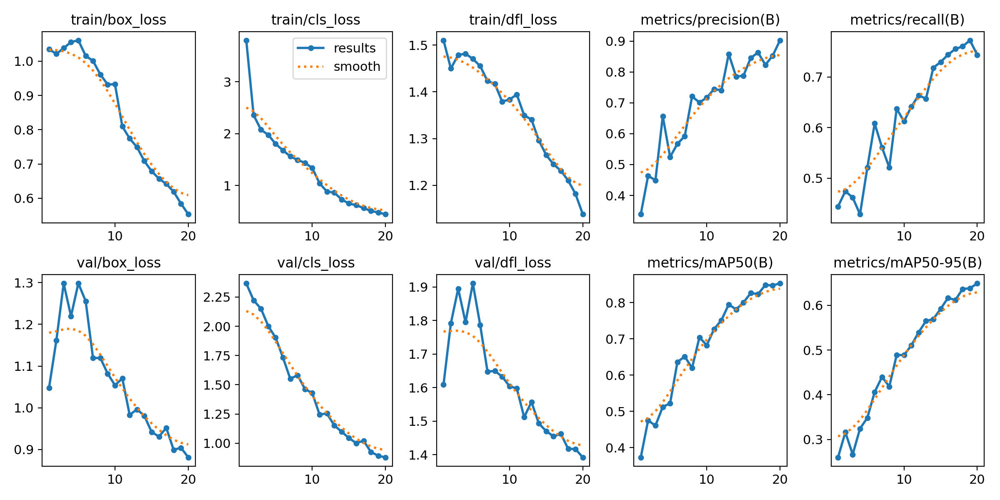

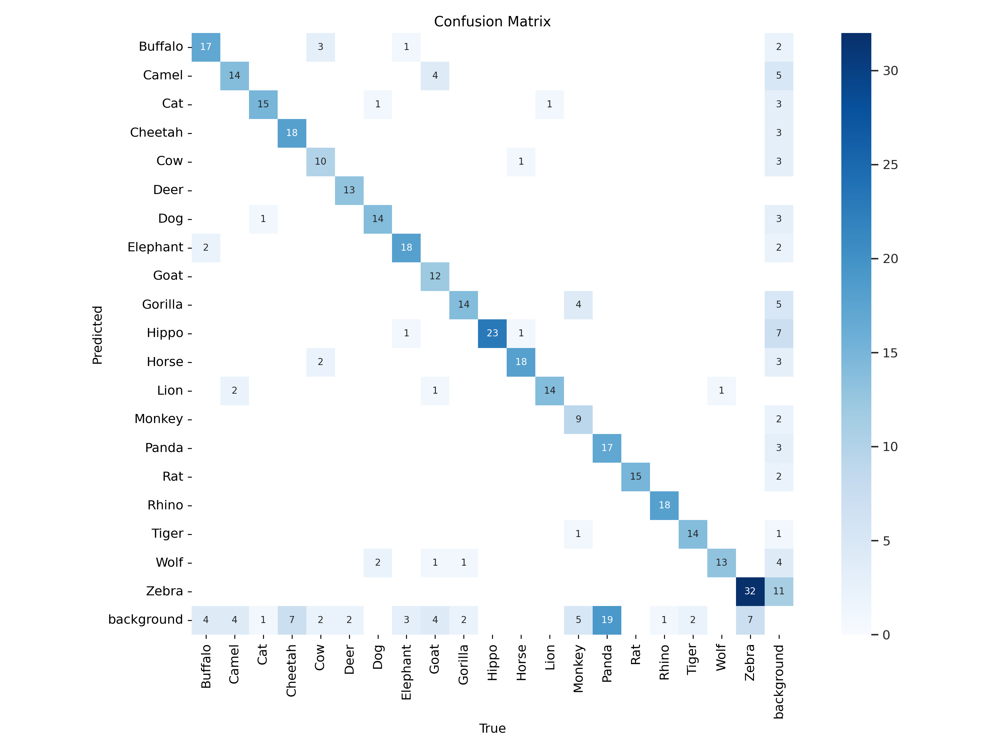

In [24]:
# Mostrar curva de mAP y loss
from PIL import Image as PImage
display(PImage.open('runs/detect/animal_yolov11s/results.png'))

# Matriz de confusión
display(PImage.open('runs/detect/animal_yolov11s/confusion_matrix.png'))

## 7. Predicción / Inferencia

Results saved to runs/detect/animal_yolov11s_predict2


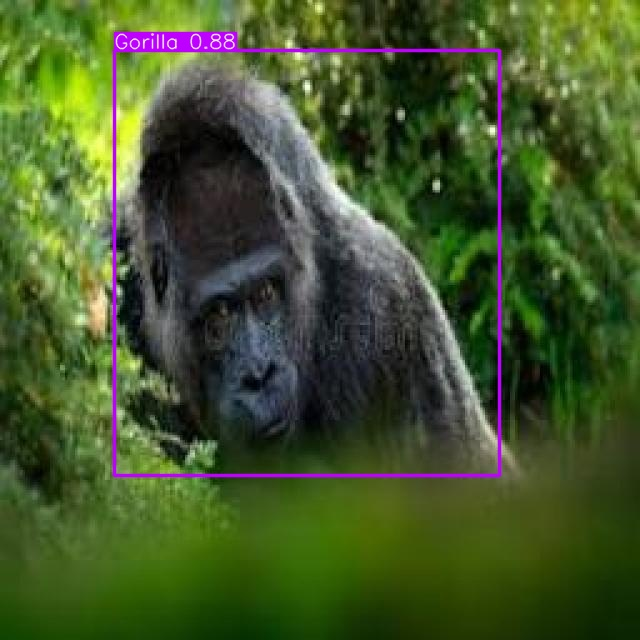

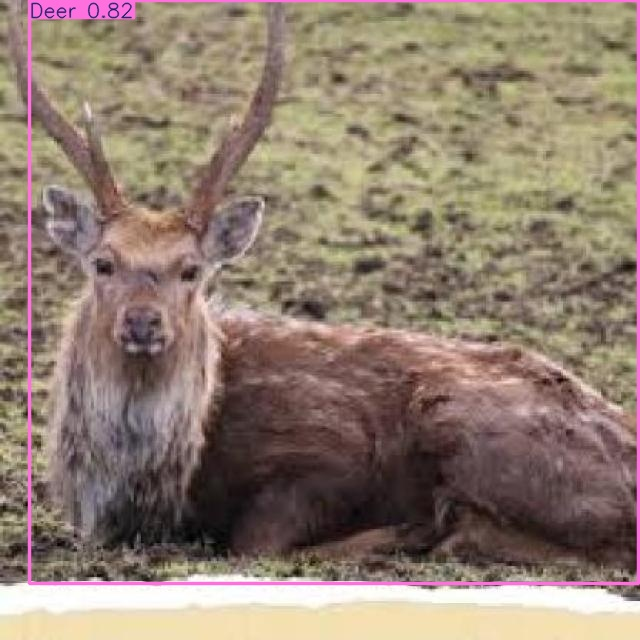

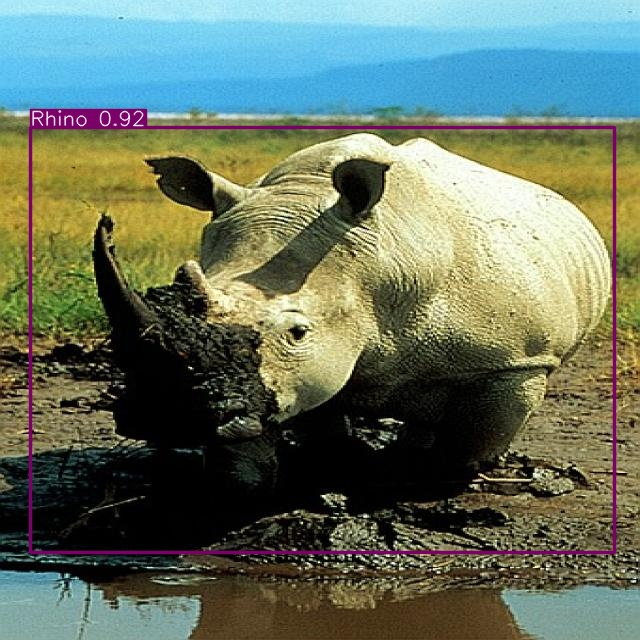

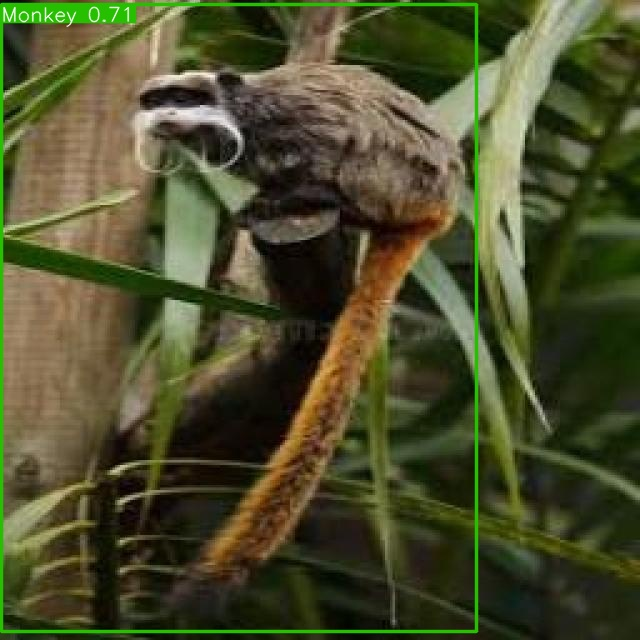

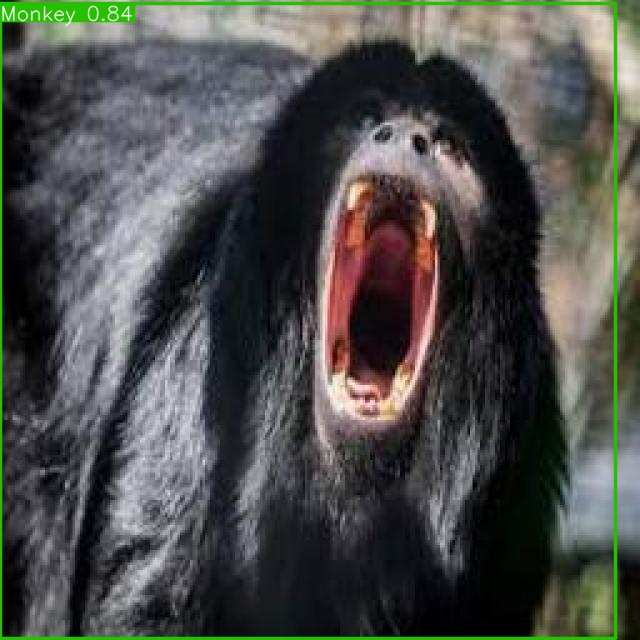

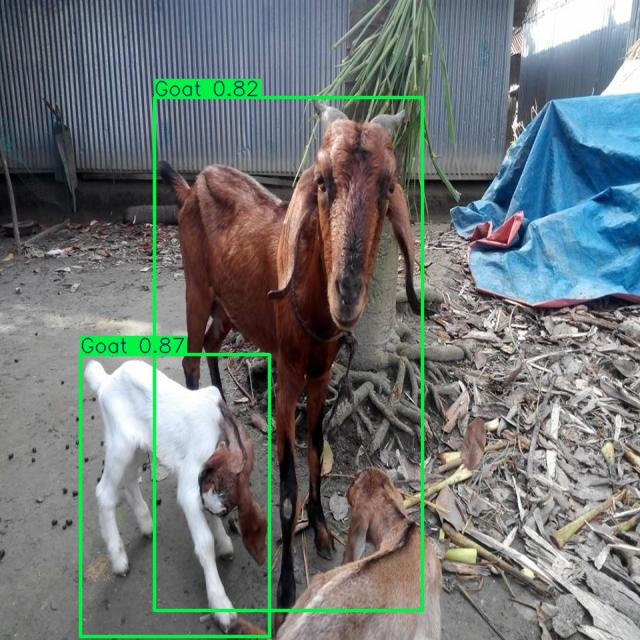

In [25]:
# Inferencia
preds = model.predict(
    source=str(root / 'test' / 'images'),
    conf=0.25,
    save=True,
    name='animal_yolov11s_predict',
    verbose=False  # Suprimir mensajes en la consola
)

# Mostrar algunas predicciones
import glob
import random
from IPython.display import display

files = glob.glob('runs/detect/animal_yolov11s_predict/*.jpg')
for img in random.sample(files, 6):
    display(PImage.open(img))

In [26]:
from ultralytics import YOLO

# Cargar modelo base (small)
model = YOLO('yolo11n.pt')

# Entrenar
results = model.train(
    data=str(root / 'animal-detection.yaml'),
    epochs=20,
    imgsz=640,
    batch=16,
    patience=5,
    name='animal_yolov11n'
)

Ultralytics 8.3.129 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=data/Multi-Class Animal Detection.v1-yolov8/animal-detection.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=animal_yolov11n2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=5, pers

train: Scanning /content/data/Multi-Class Animal Detection.v1-yolov8/train/labels.cache... 1400 images, 1 backgrounds, 0 corrupt: 100%|██████████| 1400/1400 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 477.1±166.7 MB/s, size: 40.5 KB)


val: Scanning /content/data/Multi-Class Animal Detection.v1-yolov8/valid/labels.cache... 300 images, 1 backgrounds, 0 corrupt: 100%|██████████| 300/300 [00:00<?, ?it/s]


Plotting labels to runs/detect/animal_yolov11n2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000417, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/animal_yolov11n2
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      2.78G     0.9911      3.971      1.473         34        640: 100%|██████████| 88/88 [00:26<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.34it/s]


                   all        300        412     0.0403      0.625     0.0796      0.056

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      3.16G     0.9948      3.531      1.471         31        640: 100%|██████████| 88/88 [00:24<00:00,  3.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.38it/s]

                   all        300        412       0.16       0.28      0.194      0.121



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      3.16G      1.047      3.049       1.51         25        640: 100%|██████████| 88/88 [00:25<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  3.15it/s]


                   all        300        412      0.538      0.376      0.398      0.242

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      3.16G      1.043      2.745        1.5         33        640: 100%|██████████| 88/88 [00:24<00:00,  3.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.66it/s]

                   all        300        412      0.375      0.495      0.408      0.258



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      3.16G      1.037      2.483      1.469         18        640: 100%|██████████| 88/88 [00:25<00:00,  3.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.06it/s]

                   all        300        412      0.525      0.454      0.496      0.325



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20      3.16G     0.9834      2.296       1.44         28        640: 100%|██████████| 88/88 [00:24<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.26it/s]

                   all        300        412       0.58      0.546      0.574      0.388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      3.16G     0.9722      2.169      1.419         20        640: 100%|██████████| 88/88 [00:24<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.30it/s]

                   all        300        412      0.585      0.569      0.604      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      3.16G     0.9237       2.02      1.395         30        640: 100%|██████████| 88/88 [00:24<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.40it/s]

                   all        300        412      0.643      0.544      0.621      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      3.16G      0.921      1.954       1.38         51        640: 100%|██████████| 88/88 [00:24<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.20it/s]

                   all        300        412      0.664      0.645      0.673      0.481



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      3.16G     0.9198      1.863      1.367         30        640: 100%|██████████| 88/88 [00:24<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.90it/s]

                   all        300        412      0.681      0.684      0.705      0.513


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      3.16G     0.8002      1.905      1.384          8        640: 100%|██████████| 88/88 [00:24<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.38it/s]

                   all        300        412      0.691      0.646       0.72      0.514



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      3.16G     0.7649      1.682      1.339          9        640: 100%|██████████| 88/88 [00:22<00:00,  3.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  3.86it/s]

                   all        300        412      0.723      0.651       0.72      0.532



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      3.16G      0.739      1.544      1.327          9        640: 100%|██████████| 88/88 [00:24<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.37it/s]

                   all        300        412      0.741      0.708      0.766      0.565



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      3.16G     0.7114      1.446      1.297          9        640: 100%|██████████| 88/88 [00:23<00:00,  3.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.43it/s]

                   all        300        412      0.755      0.705      0.764      0.568



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20      3.16G     0.6764      1.352      1.254          8        640: 100%|██████████| 88/88 [00:23<00:00,  3.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.40it/s]

                   all        300        412      0.772       0.69      0.766      0.571



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      3.16G     0.6727      1.288      1.257          8        640: 100%|██████████| 88/88 [00:23<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.27it/s]

                   all        300        412      0.824      0.716      0.799      0.603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      3.16G     0.6556      1.217      1.239          9        640: 100%|██████████| 88/88 [00:23<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.46it/s]

                   all        300        412      0.795      0.715      0.794      0.594



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      3.16G     0.6377      1.167      1.218          9        640: 100%|██████████| 88/88 [00:23<00:00,  3.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.28it/s]

                   all        300        412       0.82      0.734      0.811      0.611



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      3.16G     0.6225      1.145      1.202         16        640: 100%|██████████| 88/88 [00:23<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.46it/s]

                   all        300        412      0.862      0.748      0.816      0.618



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      3.16G     0.6016      1.105      1.171         13        640: 100%|██████████| 88/88 [00:23<00:00,  3.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:02<00:00,  4.47it/s]

                   all        300        412      0.881      0.718      0.814      0.624



20 epochs completed in 0.151 hours.
Optimizer stripped from runs/detect/animal_yolov11n2/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/animal_yolov11n2/weights/best.pt, 5.5MB

Validating runs/detect/animal_yolov11n2/weights/best.pt...
Ultralytics 8.3.129 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,586,052 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.46it/s]


                   all        300        412      0.878      0.719      0.814      0.624
               Buffalo         15         23      0.935      0.739       0.78       0.64
                 Camel         15         20      0.709       0.55      0.637      0.482
                   Cat         15         17      0.721      0.765      0.804       0.58
               Cheetah         15         25          1      0.627      0.843      0.516
                   Cow         15         17      0.931      0.824      0.863      0.682
                  Deer         15         15      0.923      0.733       0.89      0.721
                   Dog         15         17          1       0.93      0.974      0.753
              Elephant         15         23      0.952      0.696      0.821      0.667
                  Goat         15         22      0.839      0.474      0.748      0.529
               Gorilla         15         17       0.52      0.706      0.647      0.439
                 Hipp

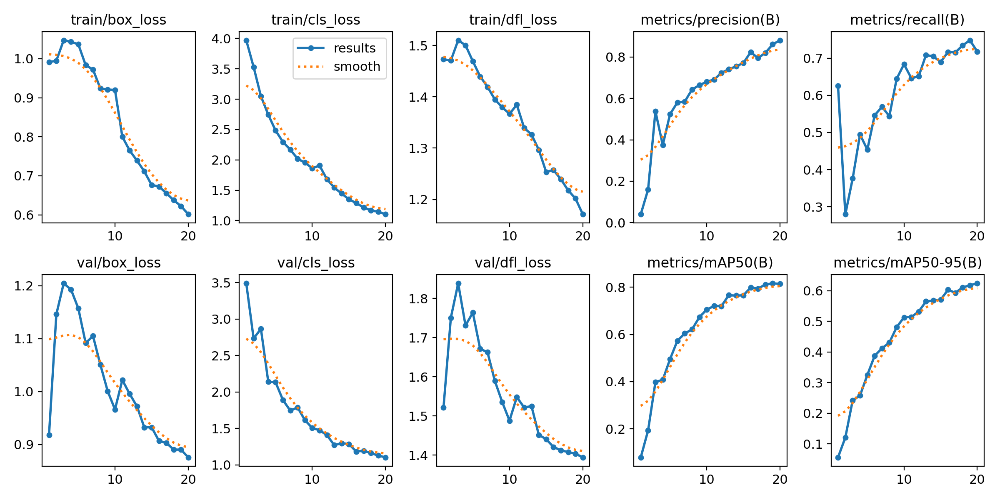

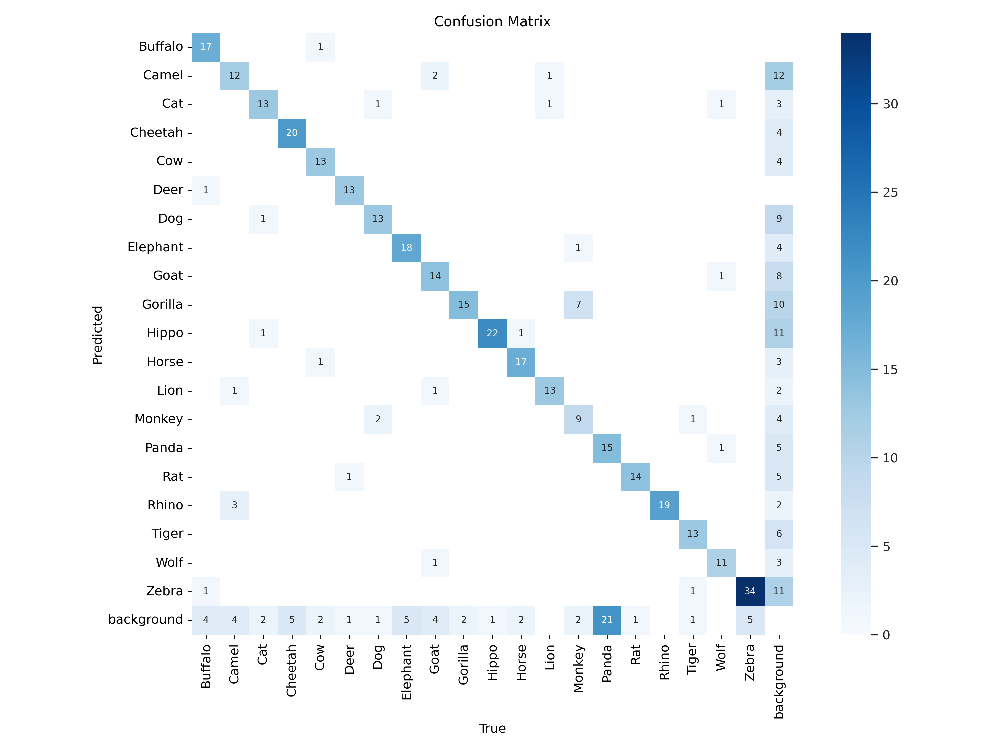

In [29]:
# Mostrar curva de mAP y loss
display(PImage.open('runs/detect/animal_yolov11n2/results.png'))

# Matriz de confusión
display(PImage.open('runs/detect/animal_yolov11n2/confusion_matrix.png'))

Results saved to runs/detect/animal_yolov11n_predict


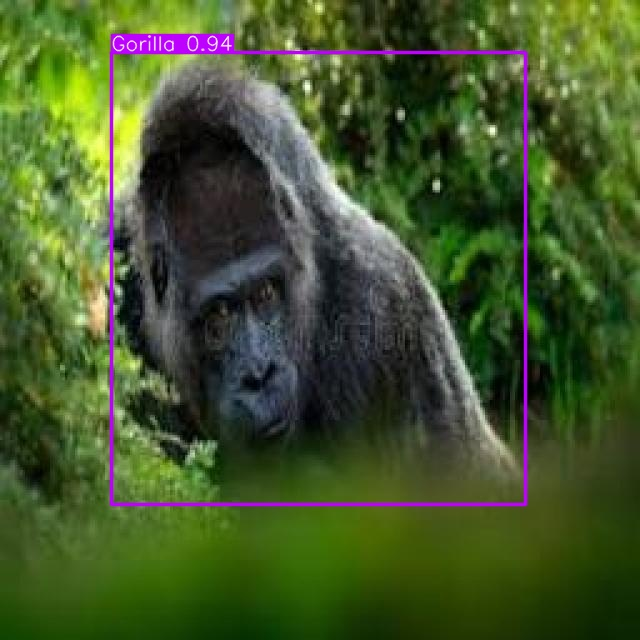

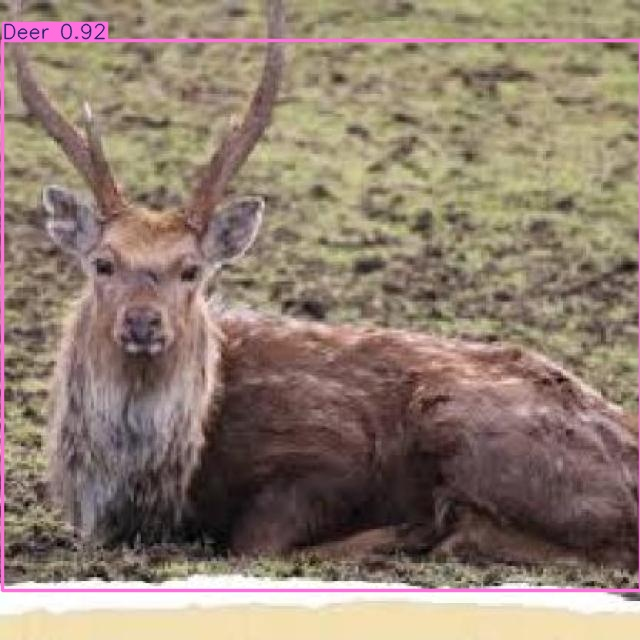

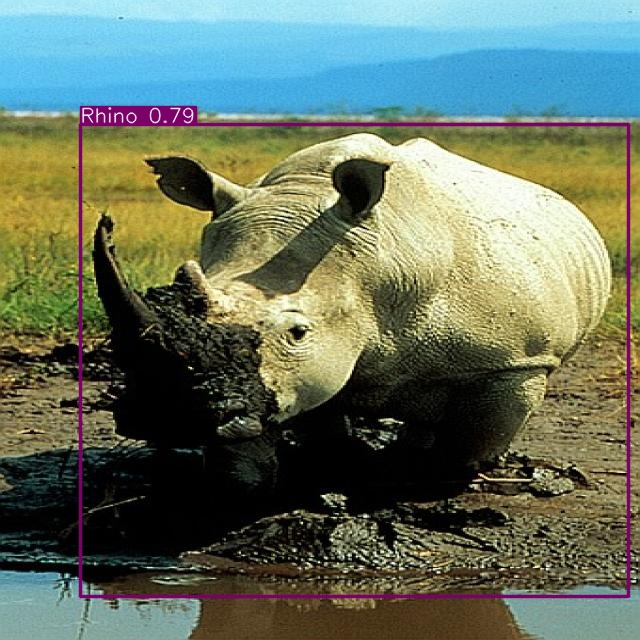

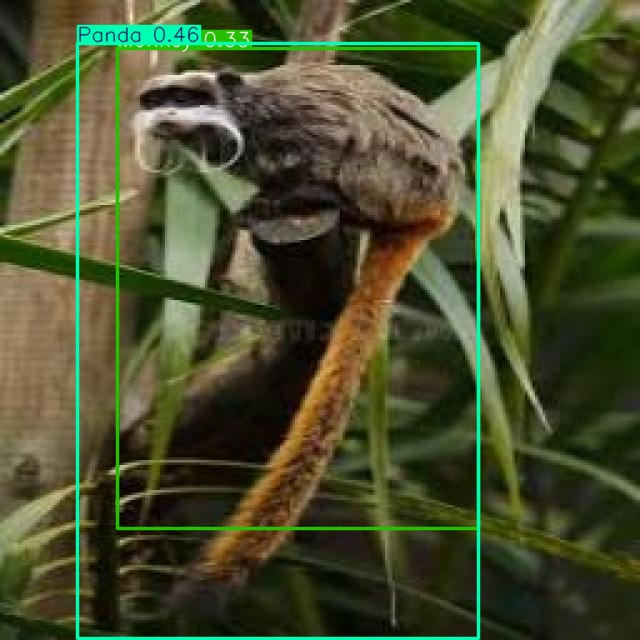

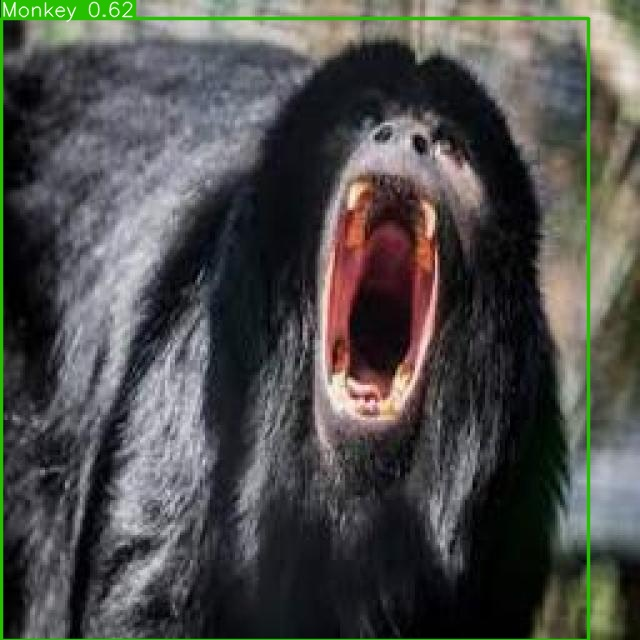

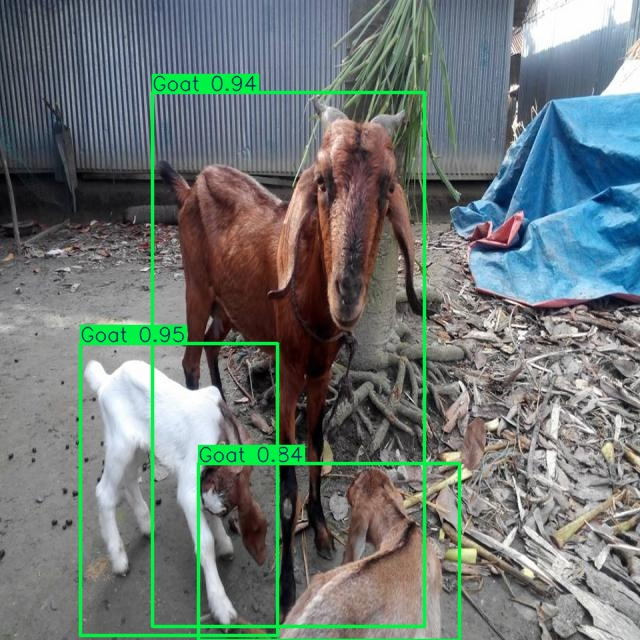

In [27]:
# Inferencia
preds = model.predict(
    source=str(root / 'test' / 'images'),
    conf=0.25,
    save=True,
    name='animal_yolov11n_predict',
    verbose=False  # Suprimir mensajes en la consola
)

# Mostrar algunas predicciones
import glob
import random
from IPython.display import display

files = glob.glob('runs/detect/animal_yolov11n_predict/*.jpg')
for img in random.sample(files, 6):
    display(PImage.open(img))

## 8. Conclusiones y Discusión

Las siguientes preguntas forman parte del entregable de esta sección. Deben ser respondidas directamente en este notebook, justificando sus respuestas con los resultados obtenidos y cualquier análisis adicional que consideren relevante.

1. **Velocidad vs. Precisión:**  
   - Comparar los tiempos de entrenamiento e inferencia entre las variantes `yolo11s` (small) y `yolo11n` (nano).  
   - ¿En qué escenarios es más conveniente usar cada variante (nano, small, medium, large, extra-large)? Cantidad de datos, recursos computacionales, etc.

2. **mAP50 vs. mAP50–95:**  
   - ¿Qué significa que mAP50 evalúe solo intersecciones sobre uniones (IoU) mayores o iguales a 0.5?  
   - ¿Qué información adicional proporciona evaluar el rango mAP50–95 al medir el rendimiento del modelo?

3. **Hiperparámetros críticos:**  
   - ¿Cómo afectan los valores de `batch` (tamaño de lote), `imgsz` (tamaño de imagen) y `patience` (paciencia para detener el entrenamiento) al tiempo de entrenamiento, uso de memoria y convergencia del modelo?

4. **Data Augmentation:**  
   - ¿Qué técnicas de aumento de datos podrían mejorar la capacidad del modelo para generalizar en diferentes escenarios?

1. Velocidad vs. Precisión

Tiempos de entrenamiento
yolo11s : 20 épocas en 10 min en T4 de Colab .
yolo11n : 20 épocas en 9 min en la misma GPU .
Latencia de inferencia (por imagen, sin batching)
small: preprocesado 0.2 ms + inferencia 4.9 ms + postprocesado 4.1 ms

nano: preprocesado 0.3 ms + inferencia 2.4 ms + postprocesado 3.2 ms


La variante nano reduce el tiempo de entrenamiento en 15 % y la latencia de inferencia en 36 % frente a small, sacrificando unos pocos puntos de mAP (≈0.814 vs. 0.853 a mAP50) pero ofreciendo un modelo de solo 5.5 MB (vs. 19.2 MB) y 6.3 GFLOPs (vs. 21.3 GFLOPs).

scenarios de uso recomendados

Nano (v11n):

Dispositivos edge con recursos muy limitados (IoT, drones)

Latencia ultra‑baja (<6 ms)

Modelos muy ligeros (<6 MB)

Small (v11s):

Smartphones y sistemas embebidos con GPU moderada

Latencia media (<10 ms) manteniendo mayor precisión (mAP50≈0.85)

Medium (v11m) (~20 M parámetros):

GPU de escritorio de gama media

Datasets de tamaño medio (10–50 k imágenes)

Large (v11l) y XL (v11x):

Servidores potentes o datacenters

Conjuntos de datos grandes (>50 k imágenes) donde la precisión extrema (mAP50–95 >0.60) justifica latencias altas

2. mAP50 vs. mAP50–95

mAP50 calcula el Average Precision considerando únicamente aquellas detecciones cuya intersección sobre unión (IoU) sea mayor o igual a 0.5. Al usar este umbral, la métrica mide la capacidad bruta del modelo para localizar y clasificar objetos con una tolerancia moderada respecto a la posición y el tamaño de las cajas predichas. En cambio, mAP50–95 promedia la AP obtenida en una serie de umbrales de IoU que van de 0.50 a 0.95, aumentando en pasos de 0.05 (es decir: 0.50, 0.55, …, 0.95). Esta métrica más amplia penaliza con mayor rigor las detecciones imprecisas, pues exige que la caja predicha encaje cada vez más ajustadamente con la caja real. Cuando existe una brecha importante entre mAP50 y mAP50–95, suele indicar que el modelo localiza bien los objetos (IoU≈0.5) pero falla al refinar con precisión la caja (IoU≥0.75). En consecuencia, mAP50–95 ofrece un panorama más completo de la calidad espacial de las predicciones y la robustez del modelo.



3. Hiperparámetros críticos

El tamaño de lote (batch) define cuántas imágenes procesa el modelo antes de actualizar sus pesos. Con lotes grandes, la estimación del gradiente es más estable y suele converger más suavemente, aunque requiere mayor memoria GPU y cada iteración tarda más. Lotes pequeños, por su parte, consumen menos memoria y permiten iteraciones más rápidas, pero introducen ruido en el gradiente y pueden necesitar más épocas para alcanzar la convergencia. El tamaño de imagen (imgsz) determina la resolución de entrada: imágenes más grandes capturan detalles finos mejorando la mAP en objetos pequeños, pero elevan drásticamente el costo computacional (GFLOPs) y el uso de memoria, prolongando cada paso de entrenamiento e inferencia. Imágenes pequeñas son más ágiles y adecuadas para prototipado o dispositivos edge, aunque a costa de una posible pérdida de precisión. Finalmente, el parámetro de paciencia (patience) controla cuántas épocas consecutivas sin mejora en la métrica de validación (por defecto mAP50) el entrenamiento tolera antes de detenerse. Una paciencia baja interrumpe el entrenamiento pronto al estancarse, ahorrando tiempo y reduciendo riesgo de overfitting, aunque corre el riesgo de truncar la convergencia antes de tiempo. Una paciencia alta, en cambio, permite superar pausas temporales en la mejora, pero puede prolongar innecesariamente el entrenamiento cuando ya no hay ganancias reales.

4. Data Augmentation

Para mejorar la capacidad de generalización, especialmente cuando el conjunto de datos carece de suficiente variabilidad, conviene aplicar una combinación de técnicas de aumento. Las transformaciones geométricas —rotaciones de ±15 °, escalados, traslaciones y volteos horizontales o verticales— expanden la diversidad de posiciones y orientaciones del objeto. El photometric jitter introduce variaciones en brillo, contraste, saturación y matiz, simulando distintas condiciones de iluminación. Las técnicas CutMix y Mosaic, propias de YOLO, combinan varias imágenes en una sola, exponiendo al modelo a contextos con múltiples objetos y fondos variados. El random erasing oculta regiones aleatorias de la imagen para forzar al modelo a basar sus predicciones en pistas contextuales y no depender de ver siempre el objeto completo. Por último, MixUp fusiona de manera lineal pares de imágenes y sus etiquetas, suavizando la distribución de clases y promoviendo mayor robustez frente al ruido y las variaciones inesperadas. Combinadas adecuadamente, estas técnicas suelen traducirse en incrementos notables en mAP50–95.